In [3]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import pandas as pd
import seaborn as sns
from sklearn.datasets import make_blobs, make_moons
from sklearn.model_selection import train_test_split
from IPython.display import HTML, display

# For interactive visualizations
import ipywidgets as widgets
from ipywidgets import interact, fixed

# Set style for plots
plt.style.use('fivethirtyeight')
sns.set(font_scale=1.3)

# Set random seed for reproducibility
np.random.seed(42)

# What is a Neural Network? An Intuitive Guide

Neural networks are the foundation of modern artificial intelligence and deep learning. This guide will walk you through the concepts, components, and mechanics of neural networks in an intuitive way.

## What We'll Cover
1. Introduction to Neural Networks
2. Biological Inspiration
3. Basic Components (Neurons, Layers, Weights)
4. Activation Functions
5. Forward Propagation
6. Simple Neural Network Example
7. Training (Backpropagation, Gradient Descent)
8. Visualizing a Neural Network
9. Applications and Use Cases
10. Hands-on Exercise

## 1. Introduction to Neural Networks

Neural networks are computational models inspired by the human brain. At their core, they're designed to recognize patterns in data.

### What makes neural networks special?

1. **Ability to learn from data**: Unlike traditional algorithms that follow explicit instructions, neural networks learn patterns from examples.
2. **Adaptability**: They can adjust to new inputs and improve over time.
3. **Pattern recognition**: They excel at finding complex patterns that humans might miss.
4. **Universal approximation**: Given enough neurons, they can model almost any function.

### The analogy of a "black box"

Think of a neural network as a black box that takes inputs and produces outputs:
- **Input**: The raw data (e.g., images, text, numbers)
- **Black Box**: The neural network processing
- **Output**: Predictions or classifications

Let's visualize this simple concept:

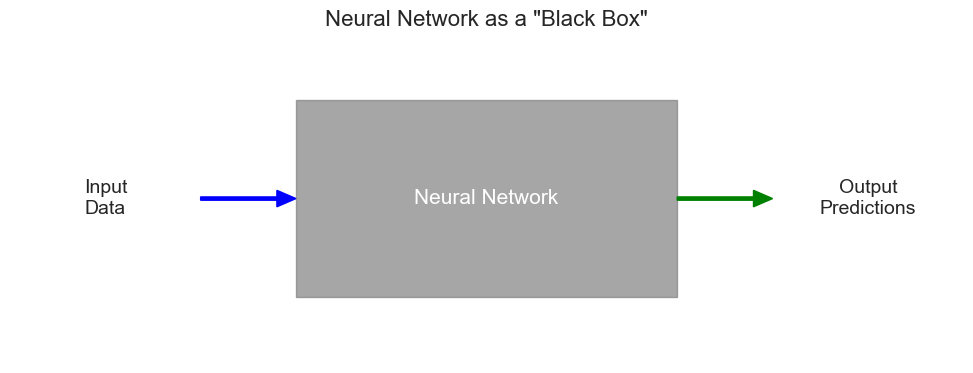

In [4]:
# Simple visualization of neural network as a black box
fig, ax = plt.subplots(figsize=(10, 4))

# Draw the box
box = plt.Rectangle((0.3, 0.2), 0.4, 0.6, fill=True, color='gray', alpha=0.7)
ax.add_patch(box)

# Add text
plt.text(0.5, 0.5, 'Neural Network', ha='center', va='center', color='white', fontsize=15)
plt.text(0.1, 0.5, 'Input\nData', ha='center', va='center', fontsize=14)
plt.text(0.9, 0.5, 'Output\nPredictions', ha='center', va='center', fontsize=14)

# Add arrows
plt.arrow(0.2, 0.5, 0.08, 0, head_width=0.05, head_length=0.02, fc='blue', ec='blue', width=0.01)
plt.arrow(0.7, 0.5, 0.08, 0, head_width=0.05, head_length=0.02, fc='green', ec='green', width=0.01)

# Remove axes
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.axis('off')

plt.title('Neural Network as a "Black Box"', fontsize=16)
plt.tight_layout()
plt.show()

## 2. Biological Inspiration

Neural networks were inspired by how neurons work in the human brain. Understanding this biological connection helps grasp the fundamental concept.

### The Human Brain
- Contains approximately 86 billion neurons
- Each neuron connects to thousands of others through synapses
- Sends electrical signals when stimulated enough
- Forms complex networks that enable learning and memory

### The Artificial Neuron
The artificial neuron (or "perceptron") mimics this behavior:
- Receives input signals (like dendrites receive signals from other neurons)
- Applies weights to these signals (like synaptic strengths)
- Sums them up (like the cell body integrating signals)
- Passes the sum through an activation function (like neurons firing when enough signals accumulate)
- Produces an output (like the axon sending signals to other neurons)

Let's see how the biological and artificial neurons compare:

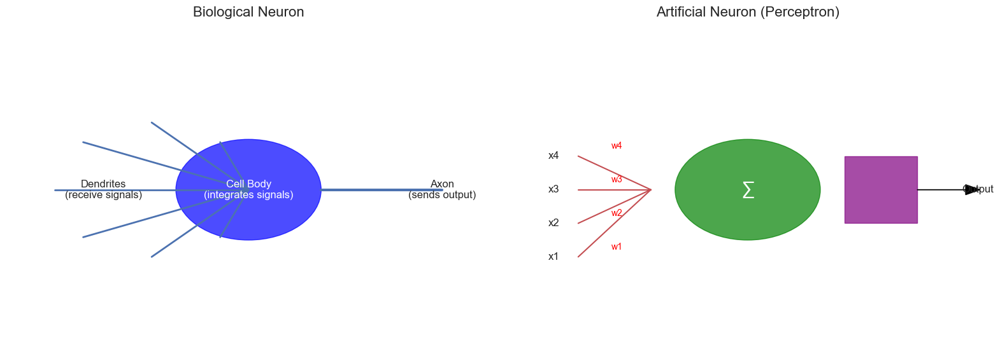

In [5]:
# Create a side-by-side comparison of biological and artificial neurons
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Biological neuron (simplified)
ax1.set_title('Biological Neuron', fontsize=16)
ax1.set_xlim(0, 10)
ax1.set_ylim(0, 10)
ax1.axis('off')

# Draw dendrites
for i in range(8):
    angle = np.pi * i / 4
    ax1.plot([3 + 2 * np.cos(angle), 5], [5 + 2 * np.sin(angle), 5], 'b-', lw=2)

# Draw cell body
ax1.add_patch(plt.Circle((5, 5), 1.5, fill=True, color='blue', alpha=0.7))

# Draw axon
ax1.plot([6.5, 9], [5, 5], 'b-', lw=3)

# Labels
ax1.text(2, 5, 'Dendrites\n(receive signals)', ha='center', va='center', fontsize=12)
ax1.text(5, 5, 'Cell Body\n(integrates signals)', ha='center', va='center', color='white', fontsize=12)
ax1.text(9, 5, 'Axon\n(sends output)', ha='center', va='center', fontsize=12)

# Artificial neuron
ax2.set_title('Artificial Neuron (Perceptron)', fontsize=16)
ax2.set_xlim(0, 10)
ax2.set_ylim(0, 10)
ax2.axis('off')

# Draw inputs
for i in range(4):
    y_pos = 3 + i
    ax2.text(1, y_pos, f'x{i+1}', ha='center', va='center', fontsize=12)
    ax2.plot([1.5, 3], [y_pos, 5], 'r-', lw=1.5)
    ax2.text(2.3, y_pos + 0.3, f'w{i+1}', ha='center', va='center', fontsize=10, color='red')

# Draw summation
ax2.add_patch(plt.Circle((5, 5), 1.5, fill=True, color='green', alpha=0.7))
ax2.text(5, 5, '∑', ha='center', va='center', color='white', fontsize=20)

# Draw activation function
ax2.add_patch(plt.Rectangle((7, 4), 1.5, 2, fill=True, color='purple', alpha=0.7))
ax2.text(7.75, 5, '', ha='center', va='center', color='white', fontsize=16)

# Draw output
ax2.arrow(8.5, 5, 1, 0, head_width=0.3, head_length=0.3, fc='black', ec='black')
ax2.text(9.75, 5, 'Output', ha='center', va='center', fontsize=12)

plt.tight_layout()
plt.show()

## 3. Basic Components of Neural Networks

A neural network consists of several key components:

### Neurons
- The basic computational units
- Each neuron performs a simple calculation
- Connected together to form a powerful system

### Layers
Neural networks are organized in layers:
- **Input Layer**: Receives the raw data
- **Hidden Layers**: Process the information (can be multiple)
- **Output Layer**: Produces the final result

### Weights and Biases
- **Weights**: Determine the strength of connections between neurons
- **Biases**: Allow neurons to shift their activation function

### The mathematical representation

For a single neuron with inputs $x₁, x₂, ..., xₙ$:
1. Calculate weighted sum: $z = w₁x₁ + w₂x₂ + ... + wₙxₙ + b$
2. Apply activation function: $output = \sigma(z)$

Let's visualize a simple neural network architecture:

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Helper to evenly space neurons vertically
def compute_layer_positions(num_neurons, total_height=6, margin=1):
    if num_neurons == 1:
        return [total_height / 2]
    step = (total_height - 2 * margin) / (num_neurons - 1)
    return [margin + i * step for i in range(num_neurons)]

def plot_neural_network(num_input=3, num_hidden=4, num_output=2, figsize=(10, 6)):
    fig, ax = plt.subplots(figsize=figsize)

    # Compute y positions
    total_height = 6
    y_input = compute_layer_positions(num_input, total_height)
    y_hidden = compute_layer_positions(num_hidden, total_height)
    y_output = compute_layer_positions(num_output, total_height)

    # Layer x positions
    input_x, hidden_x, output_x = 0.5, 2.0, 3.5

    ax.set_xlim(0, 4)
    ax.set_ylim(0, total_height)
    ax.axis('off')

    # Draw neurons
    input_neurons = []
    for i, y in enumerate(y_input):
        circle = plt.Circle((input_x, y), 0.2, color='blue', alpha=0.7)
        ax.add_patch(circle)
        ax.text(input_x, y, f'x{i+1}', ha='center', va='center', color='white', fontsize=12)
        input_neurons.append((input_x, y))

    hidden_neurons = []
    for y in y_hidden:
        circle = plt.Circle((hidden_x, y), 0.2, color='green', alpha=0.7)
        ax.add_patch(circle)
        hidden_neurons.append((hidden_x, y))

    output_neurons = []
    for i, y in enumerate(y_output):
        circle = plt.Circle((output_x, y), 0.2, color='red', alpha=0.7)
        ax.add_patch(circle)
        ax.text(output_x, y, f'y{i+1}', ha='center', va='center', color='white', fontsize=12)
        output_neurons.append((output_x, y))

    # Draw connections
    for i_pos in input_neurons:
        for h_pos in hidden_neurons:
            ax.plot([i_pos[0] + 0.2, h_pos[0] - 0.2], [i_pos[1], h_pos[1]], 'k-', alpha=0.3)
    for h_pos in hidden_neurons:
        for o_pos in output_neurons:
            ax.plot([h_pos[0] + 0.2, o_pos[0] - 0.2], [h_pos[1], o_pos[1]], 'k-', alpha=0.3)

    # Add layer labels above the topmost neuron
    ax.text(input_x, max(y_input) + 0.5, 'Input Layer', ha='center', fontsize=14)
    ax.text(hidden_x, max(y_hidden) + 0.5, 'Hidden Layer', ha='center', fontsize=14)
    ax.text(output_x, max(y_output) + 0.5, 'Output Layer', ha='center', fontsize=14)

    # Title and layout
    plt.title('Simple Neural Network Architecture', fontsize=16)
    plt.subplots_adjust(top=0.85, bottom=0.05)

    return fig, ax
    
# Create an interactive neural network visualization
def interactive_nn_visualization(num_input, num_hidden, num_output):
    plot_neural_network(num_input, num_hidden, num_output)
    plt.subplots_adjust(top=0.9, bottom=0.1)
    plt.show()

# Create a widget for interactive visualization
interact(interactive_nn_visualization, 
         num_input=widgets.IntSlider(min=1, max=10, step=1, value=3, description='Input Neurons:'),
         num_hidden=widgets.IntSlider(min=1, max=10, step=1, value=4, description='Hidden Neurons:'),
         num_output=widgets.IntSlider(min=1, max=10, step=1, value=2, description='Output Neurons:'))

# # Also show a fixed example
# plot_neural_network(4, 5, 3)
# plt.tight_layout()
# plt.show()

interactive(children=(IntSlider(value=3, description='Input Neurons:', max=10, min=1), IntSlider(value=4, desc…

<function __main__.interactive_nn_visualization(num_input, num_hidden, num_output)>

## 4. Activation Functions

Activation functions are crucial components that introduce non-linearity into neural networks, allowing them to learn complex patterns.

### Why do we need activation functions?

Without activation functions, neural networks would only be able to learn linear relationships. No matter how many layers we add, we'd still only be able to represent linear transformations.

### Common activation functions:

1. **Sigmoid**: Squashes values between 0 and 1
   - Formula: σ(x) = 1 / (1 + e^(-x))
   - Good for binary classification output layers

2. **Hyperbolic Tangent (tanh)**: Squashes values between -1 and 1
   - Formula: tanh(x) = (e^x - e^(-x)) / (e^x + e^(-x))
   - Similar to sigmoid but centered around 0

3. **Rectified Linear Unit (ReLU)**: Returns x if positive, otherwise 0
   - Formula: ReLU(x) = max(0, x)
   - Most popular for hidden layers due to efficiency and reduced vanishing gradient problem

4. **Leaky ReLU**: Similar to ReLU but allows small negative values
   - Formula: Leaky ReLU(x) = max(0.01x, x)
   - Addresses the "dying ReLU" problem

Let's visualize these activation functions:

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import ipywidgets as widgets
from ipywidgets import interact

# Define x range
x = np.linspace(-5, 5, 1000)

# Activation functions
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def tanh(x):
    return np.tanh(x)

def relu(x):
    return np.maximum(0, x)

def leaky_relu(x, alpha=0.01):
    return np.maximum(alpha * x, x)

# Plot function
def plot_activation(activation):
    plt.figure(figsize=(10, 5))

    title = "Activation Function"

    if activation == 'all':
        plt.plot(x, sigmoid(x), 'b-', label='Sigmoid', linewidth=2)
        plt.plot(x, tanh(x), 'g-', label='Tanh', linewidth=2)
        plt.plot(x, relu(x), 'r-', label='ReLU', linewidth=2)
        plt.plot(x, leaky_relu(x), 'm-', label='Leaky ReLU (α=0.01)', linewidth=2)
        title = "All Activation Functions"
    else:
        if activation == 'sigmoid':
            plt.plot(x, sigmoid(x), 'b-', label='Sigmoid', linewidth=2)
        elif activation == 'tanh':
            plt.plot(x, tanh(x), 'g-', label='Tanh', linewidth=2)
        elif activation == 'relu':
            plt.plot(x, relu(x), 'r-', label='ReLU', linewidth=2)
        elif activation == 'leaky_relu':
            plt.plot(x, leaky_relu(x), 'm-', label='Leaky ReLU (α=0.01)', linewidth=2)
        title = f"{activation.replace('_', ' ').title()} Activation Function"

    plt.grid(True, alpha=0.3)
    plt.axhline(0, color='k', linestyle='--', alpha=0.3)
    plt.axvline(0, color='k', linestyle='--', alpha=0.3)
    plt.ylim(-1.5, 5.5)
    plt.xlim(-5, 5)
    plt.xlabel('Input (x)', fontsize=12)
    plt.ylabel('Output f(x)', fontsize=12)
    plt.title(title, fontsize=14)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Create dropdown widget
activation_dropdown = widgets.Dropdown(
    options=['all', 'sigmoid', 'tanh', 'relu', 'leaky_relu'],
    value='sigmoid',
    description='Function:',
)

# Launch interactive widget
interact(plot_activation, activation=activation_dropdown)

interactive(children=(Dropdown(description='Function:', index=1, options=('all', 'sigmoid', 'tanh', 'relu', 'l…

<function __main__.plot_activation(activation)>

## 5. Forward Propagation

Forward propagation is the process of passing input data through the neural network to get an output.

### The step-by-step process:

1. Input data enters the network through the input layer
2. For each neuron in the first hidden layer:
   - Calculate the weighted sum of inputs + bias
   - Apply the activation function
   - Pass the result to the next layer
3. Repeat for each layer until the output layer is reached
4. The final output is the network's prediction or classification

Let's visualize the forward propagation process with a simple network:

In [14]:
# Create a simple forward propagation visualization with summation and activation
def create_forward_propagation_animation(num_frames=80):
    # Create a simple network
    fig, ax = plt.subplots(figsize=(14, 7))
    ax.set_xlim(0, 4)
    ax.set_ylim(0, 4)
    ax.axis('off')
    
    # Layer positions
    input_x, hidden_x, output_x = 0.5, 2.0, 3.5
    
    # Neuron positions
    input_neurons = [(input_x, 1), (input_x, 2), (input_x, 3)]
    hidden_neurons = [(hidden_x, 1), (hidden_x, 2), (hidden_x, 3)]
    output_neurons = [(output_x, 1.5), (output_x, 2.5)]
    
    # Draw neurons with lowered opacity initially
    input_circles = []
    for x, y in input_neurons:
        circle = plt.Circle((x, y), 0.2, fill=True, color='blue', alpha=0.7)
        ax.add_patch(circle)
        input_circles.append(circle)
        
    hidden_circles = []
    for x, y in hidden_neurons:
        circle = plt.Circle((x, y), 0.2, fill=True, color='green', alpha=0.4)
        ax.add_patch(circle)
        hidden_circles.append(circle)
        
    output_circles = []
    for x, y in output_neurons:
        circle = plt.Circle((x, y), 0.2, fill=True, color='red', alpha=0.4)
        ax.add_patch(circle)
        output_circles.append(circle)
    
    # Add layer labels
    ax.text(input_x, 3.7, 'Input Layer', ha='center', fontsize=14)
    ax.text(hidden_x, 3.7, 'Hidden Layer', ha='center', fontsize=14)
    ax.text(output_x, 3.7, 'Output Layer', ha='center', fontsize=14)
    
    # Initialize signals on connections
    input_to_hidden_signals = []
    for i_pos in input_neurons:
        for h_pos in hidden_neurons:
            signal = plt.Circle((i_pos[0], i_pos[1]), 0.05, color='purple', alpha=0)
            ax.add_patch(signal)
            input_to_hidden_signals.append((signal, i_pos, h_pos))
    
    hidden_to_output_signals = []
    for h_pos in hidden_neurons:
        for o_pos in output_neurons:
            signal = plt.Circle((h_pos[0], h_pos[1]), 0.05, color='purple', alpha=0)
            ax.add_patch(signal)
            hidden_to_output_signals.append((signal, h_pos, o_pos))
    
    # Create connection lines (initially with low opacity)
    input_to_hidden_lines = []
    for i_pos in input_neurons:
        for h_pos in hidden_neurons:
            line, = ax.plot([i_pos[0], h_pos[0]], [i_pos[1], h_pos[1]], 'k-', alpha=0.2)
            input_to_hidden_lines.append(line)
    
    hidden_to_output_lines = []
    for h_pos in hidden_neurons:
        for o_pos in output_neurons:
            line, = ax.plot([h_pos[0], o_pos[0]], [h_pos[1], o_pos[1]], 'k-', alpha=0.2)
            hidden_to_output_lines.append(line)
    
    # Create summation and activation symbols (initially invisible)
    hidden_sum_symbols = []
    for h_pos in hidden_neurons:
        sum_text = ax.text(h_pos[0], h_pos[1], "g(Σ)", ha='center', va='center', 
                          fontsize=14, fontweight='bold', color='purple', alpha=0)
        hidden_sum_symbols.append(sum_text)
    
    output_sum_symbols = []
    for o_pos in output_neurons:
        sum_text = ax.text(o_pos[0], o_pos[1], "g(Σ)", ha='center', va='center', 
                          fontsize=14, fontweight='bold', color='purple', alpha=0)
        output_sum_symbols.append(sum_text)
    
    # # Create activation symbols (initially invisible)
    # hidden_activation_symbols = []
    # for h_pos in hidden_neurons:
    #     act_text = ax.text(h_pos[0], h_pos[1] - 0.4, "σ()", ha='center', va='center', 
    #                      fontsize=12, fontweight='bold', color='white', alpha=0,
    #                      bbox=dict(facecolor='green', alpha=0.5))
    #     hidden_activation_symbols.append(act_text)
    # 
    # output_activation_symbols = []
    # for o_pos in output_neurons:
    #     act_text = ax.text(o_pos[0], o_pos[1] - 0.4, "σ()", ha='center', va='center', 
    #                      fontsize=12, fontweight='bold', color='white', alpha=0,
    #                      bbox=dict(facecolor='red', alpha=0.5))
    #     output_activation_symbols.append(act_text)
    
    # Create title
    title = ax.text(2, 0.2, 'Forward Propagation Process', ha='center', fontsize=16)
    
    # Setup the animation
    def update(frame):
        # First phase: Input neurons activate (frames 0-9)
        if frame < 10:
            progress = frame / 9
            
            # Highlight input neurons
            for circle in input_circles:
                circle.set_alpha(0.7 + 0.3 * progress)
                
            title.set_text('Phase 1: Input Neurons Activate')
                
        # Second phase: signals travel to hidden layer (frames 10-29)
        elif frame < 30:
            progress = (frame - 10) / 19
            
            # Move signals from input to hidden
            for signal, start, end in input_to_hidden_signals:
                x = start[0] + progress * (end[0] - start[0])
                y = start[1] + progress * (end[1] - start[1])
                signal.set_center((x, y))
                signal.set_alpha(0.8)
                
            # Highlight the connections
            for line in input_to_hidden_lines:
                line.set_alpha(0.2 + 0.6 * progress)
                
            title.set_text('Phase 2: Signals Travel to Hidden Layer')
                
        # Third phase: hidden neurons sum inputs (frames 30-39)
        elif frame < 40:
            progress = (frame - 30) / 9
            
            # Fade out signals
            for signal, _, _ in input_to_hidden_signals:
                signal.set_alpha(0.8 * (1 - progress))
                
            # Show summation symbols
            for sum_text in hidden_sum_symbols:
                sum_text.set_alpha(progress)
                
            title.set_text('Phase 3: Hidden Neurons Sum Inputs')
                
        # Fourth phase: hidden neurons activate (frames 40-49)
        elif frame < 50:
            progress = (frame - 40) / 9
            
            # Hide summation symbols
            for sum_text in hidden_sum_symbols:
                sum_text.set_alpha(1 - progress)
                
            # # Show activation process
            # for act_text in hidden_activation_symbols:
            #     act_text.set_alpha(progress)
                
            # Highlight hidden neurons
            for circle in hidden_circles:
                circle.set_alpha(0.4 + 0.6 * progress)
                
            title.set_text('Phase 4: Hidden Neurons Apply Activation Function')
                
        # Fifth phase: signals travel to output (frames 50-59)
        elif frame < 60:
            progress = (frame - 50) / 9
            
            # # Hide activation symbols
            # for act_text in hidden_activation_symbols:
            #     act_text.set_alpha(1 - progress)
            # 
            # Move signals from hidden to output
            for signal, start, end in hidden_to_output_signals:
                x = start[0] + progress * (end[0] - start[0])
                y = start[1] + progress * (end[1] - start[1])
                signal.set_center((x, y))
                signal.set_alpha(0.8)
                
            # Highlight connections
            for line in hidden_to_output_lines:
                line.set_alpha(0.2 + 0.6 * progress)
                
            title.set_text('Phase 5: Signals Travel to Output Layer')
                
        # Sixth phase: output neurons sum inputs (frames 60-69)
        elif frame < 70:
            progress = (frame - 60) / 9
            
            # Fade out signals
            for signal, _, _ in hidden_to_output_signals:
                signal.set_alpha(0.8 * (1 - progress))
                
            # Show summation symbols
            for sum_text in output_sum_symbols:
                sum_text.set_alpha(progress)
                
            title.set_text('Phase 6: Output Neurons Sum Inputs')
                
        # Final phase: output neurons activate (frames 70-79)
        else:
            progress = (frame - 70) / 9
            
            # Hide summation symbols
            for sum_text in output_sum_symbols:
                sum_text.set_alpha(1 - progress)
            #     
            # # Show activation process
            # for act_text in output_activation_symbols:
            #     act_text.set_alpha(progress)
                
            # Highlight output neurons
            for circle in output_circles:
                circle.set_alpha(0.4 + 0.6 * progress)
                
            title.set_text('Phase 7: Output Neurons Generate Predictions')
        
        # Collect all artists that need to be updated
        artists = [title] + input_circles + hidden_circles + output_circles + input_to_hidden_lines + hidden_to_output_lines
        artists += [signal for signal, _, _ in input_to_hidden_signals]
        artists += [signal for signal, _, _ in hidden_to_output_signals]
        artists += hidden_sum_symbols + output_sum_symbols
        # artists += hidden_activation_symbols + output_activation_symbols
        
        return artists
    
    anim = FuncAnimation(fig, update, frames=num_frames, interval=100, blit=False)
    plt.close()  # Prevents duplicate display
    return anim

# Create and display the animation
anim = create_forward_propagation_animation()
HTML(anim.to_jshtml())

## 6. Training Neural Networks

Training a neural network involves optimizing its weights to minimize the difference between predicted and actual outputs.

### Key components of training:

1. **Loss Function**: Measures how far the predictions are from the actual values
   - **Mean Squared Error (MSE)**: For regression problems
   - **Cross-Entropy Loss**: For classification problems

2. **Backpropagation**: The algorithm that computes gradients 
   - Calculates how each weight contributes to the error
   - Applies the chain rule of calculus to find gradients

3. **Gradient Descent**: The optimization algorithm
   - Updates weights in the opposite direction of the gradient
   - Learning rate controls the step size

### The training process:

1. Forward Propagation: Make predictions
2. Calculate Loss: Compare predictions with actual values
3. Backpropagation: Compute gradients
4. Update Weights: Adjust weights and biases
5. Repeat: Iterate until convergence

Let's visualize the gradient descent process:

In [ ]:
# Create a visualization of gradient descent
def plot_gradient_descent():
    # Create a simple loss landscape
    x = np.linspace(-2, 2, 100)
    y = np.linspace(-2, 2, 100)
    X, Y = np.meshgrid(x, y)
    Z = X**2 + Y**2  # Simple bowl-shaped loss function
    
    # Create a path of gradient descent
    path_x = []
    path_y = []
    path_z = []
    
    # Starting point
    current_x = 1.8
    current_y = 1.8
    learning_rate = 0.1
    
    # Simulate gradient descent
    for _ in range(20):
        path_x.append(current_x)
        path_y.append(current_y)
        path_z.append(current_x**2 + current_y**2)
        
        # Gradient of our loss function (2x, 2y)
        grad_x = 2 * current_x
        grad_y = 2 * current_y
        
        # Update position (opposite direction of gradient)
        current_x -= learning_rate * grad_x
        current_y -= learning_rate * grad_y
    
    # Plot 3D surface
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot loss surface
    surf = ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.6)
    
    # Plot path of gradient descent
    ax.plot(path_x, path_y, path_z, 'ro-', markersize=7, linewidth=2, label='Gradient Descent Path')
    
    # Add a marker for the starting point
    ax.plot([path_x[0]], [path_y[0]], [path_z[0]], 'ko', markersize=10, label='Starting Point')
    
    # Add a marker for the minimum
    ax.plot([0], [0], [0], 'go', markersize=10, label='Global Minimum')
    
    ax.set_xlabel('Weight 1', fontsize=14)
    ax.set_ylabel('Weight 2', fontsize=14)
    ax.set_zlabel('Loss', fontsize=14)
    ax.set_title('Gradient Descent Optimization', fontsize=16)
    ax.legend(fontsize=12)
    
    plt.tight_layout()
    plt.show()
    
    # Also create a 2D contour plot for clarity
    plt.figure(figsize=(10, 8))
    cp = plt.contourf(X, Y, Z, 20, cmap='viridis', alpha=0.7)
    plt.colorbar(cp)
    
    # Plot the path of gradient descent
    plt.plot(path_x, path_y, 'ro-', markersize=7, linewidth=2, label='Gradient Descent Path')
    plt.plot(path_x[0], path_y[0], 'ko', markersize=10, label='Starting Point')
    plt.plot(0, 0, 'go', markersize=10, label='Global Minimum')
    
    plt.title('Gradient Descent (Top View)', fontsize=16)
    plt.xlabel('Weight 1', fontsize=14)
    plt.ylabel('Weight 2', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

# Visualize gradient descent
plot_gradient_descent()

# Now let's visualize the backpropagation process
def create_backpropagation_animation(num_frames=80):
    # Create a simple network for visualization
    fig, ax = plt.subplots(figsize=(14, 8))
    ax.set_xlim(0, 10)
    ax.set_ylim(0, 6)
    ax.axis('off')
    
    # Layer positions
    input_x, hidden_x, output_x = 1.0, 5.0, 9.0
    
    # Neuron positions
    input_neurons = [(input_x, 1.5), (input_x, 4.5)]
    hidden_neurons = [(hidden_x, 1), (hidden_x, 3), (hidden_x, 5)]
    output_neurons = [(output_x, 3)]
    
    # Draw neurons
    input_circles = []
    for x, y in input_neurons:
        circle = plt.Circle((x, y), 0.4, fill=True, color='blue', alpha=0.7)
        ax.add_patch(circle)
        input_circles.append(circle)
        
    hidden_circles = []
    for x, y in hidden_neurons:
        circle = plt.Circle((x, y), 0.4, fill=True, color='green', alpha=0.7)
        ax.add_patch(circle)
        hidden_circles.append(circle)
        
    output_circles = []
    for x, y in output_neurons:
        circle = plt.Circle((x, y), 0.4, fill=True, color='red', alpha=0.7)
        ax.add_patch(circle)
        output_circles.append(circle)
    
    # Add layer labels
    ax.text(input_x, 5.8, 'Input Layer', ha='center', fontsize=16)
    ax.text(hidden_x, 5.8, 'Hidden Layer', ha='center', fontsize=16)
    ax.text(output_x, 5.8, 'Output Layer', ha='center', fontsize=16)
    
    # Draw connections
    forward_lines = []
    ih_lines = []
    for i_pos in input_neurons:
        for h_pos in hidden_neurons:
            line, = ax.plot([i_pos[0], h_pos[0]], [i_pos[1], h_pos[1]], 'k-', alpha=0.3, linewidth=1.5)
            ih_lines.append(line)
            forward_lines.append(line)
    
    ho_lines = []
    for h_pos in hidden_neurons:
        for o_pos in output_neurons:
            line, = ax.plot([h_pos[0], o_pos[0]], [h_pos[1], o_pos[1]], 'k-', alpha=0.3, linewidth=1.5)
            ho_lines.append(line)
            forward_lines.append(line)
    
    # Add error and update symbols
    error_symbol = ax.text(output_x + 1, output_neurons[0][1], "Error", color='red', fontsize=16, 
                          ha='center', va='center', visible=False)
    target_symbol = ax.text(output_x + 1, output_neurons[0][1] + 0.8, "Target", color='green', fontsize=14, 
                           ha='center', va='center', visible=False)
    
    # Backward lines (initially invisible)
    backward_lines = []
    oh_lines = []
    for h_pos in hidden_neurons:
        for o_pos in output_neurons:
            line, = ax.plot([o_pos[0], h_pos[0]], [o_pos[1], h_pos[1]], 'r-', alpha=0, linewidth=2, 
                           linestyle='--')
            oh_lines.append(line)
            backward_lines.append(line)
    
    hi_lines = []
    for i_pos in input_neurons:
        for h_pos in hidden_neurons:
            line, = ax.plot([h_pos[0], i_pos[0]], [h_pos[1], i_pos[1]], 'r-', alpha=0, linewidth=2, 
                           linestyle='--')
            hi_lines.append(line)
            backward_lines.append(line)
    
    # Weight update symbols (initially invisible)
    weight_update_symbols = []
    for line in forward_lines:
        x = (line.get_xdata()[0] + line.get_xdata()[1]) / 2
        y = (line.get_ydata()[0] + line.get_ydata()[1]) / 2
        symbol = ax.text(x, y, "Δw", color='purple', fontsize=12, fontweight='bold',
                       ha='center', va='center', bbox=dict(facecolor='white', alpha=0.7), visible=False)
        weight_update_symbols.append(symbol)
    
    # Add title
    title = ax.text(5, 0.5, 'Backpropagation Process', ha='center', fontsize=18, fontweight='bold')
    
    # Animation function
    def update(frame):
        # Reset all visibility
        error_symbol.set_visible(False)
        target_symbol.set_visible(False)
        for line in backward_lines:
            line.set_alpha(0)
        for symbol in weight_update_symbols:
            symbol.set_visible(False)
        
        # Phase 1: Forward pass (frames 0-19)
        if frame < 20:
            percentage = frame / 19
            title.set_text('Phase 1: Forward Propagation')
            
            # Gradually light up the input-hidden connections
            if frame < 10:
                sub_percentage = frame / 9
                for line in ih_lines:
                    line.set_alpha(0.3 + 0.5 * sub_percentage)
                for circle in input_circles:
                    circle.set_alpha(0.7 + 0.3 * sub_percentage)
            
            # Then light up the hidden-output connections
            else:
                sub_percentage = (frame - 10) / 9
                for line in ho_lines:
                    line.set_alpha(0.3 + 0.5 * sub_percentage)
                for circle in hidden_circles:
                    circle.set_alpha(0.7 + 0.3 * sub_percentage)
                for circle in output_circles:
                    circle.set_alpha(0.7 + 0.3 * sub_percentage)
        
        # Phase 2: Calculate error (frames 20-29)
        elif frame < 30:
            title.set_text('Phase 2: Calculate Error (Output - Target)')
            # Display the error and target
            error_symbol.set_visible(True)
            target_symbol.set_visible(True)
            # Pulse the output neuron
            pulse = 0.7 + 0.3 * np.sin((frame - 20) * np.pi / 4.5) 
            for circle in output_circles:
                circle.set_alpha(pulse)
        
        # Phase 3: Backpropagate the error to hidden layer (frames 30-44)
        elif frame < 45:
            title.set_text('Phase 3: Backpropagate Error to Hidden Layer')
            percentage = (frame - 30) / 14
            # Gradually show backward propagation lines from output to hidden
            for line in oh_lines:
                line.set_alpha(min(1.0, percentage * 2))
            # Pulse hidden neurons as they receive error
            if frame >= 37:
                pulse = 0.7 + 0.3 * np.sin((frame - 37) * np.pi / 4)
                for circle in hidden_circles:
                    circle.set_alpha(pulse)
        
        # Phase 4: Backpropagate the error to input layer (frames 45-59)
        elif frame < 60:
            title.set_text('Phase 4: Backpropagate Error to Input Layer')
            percentage = (frame - 45) / 14
            # Keep output to hidden backprop lines visible
            for line in oh_lines:
                line.set_alpha(1.0)
            # Gradually show backward propagation lines from hidden to input
            for line in hi_lines:
                line.set_alpha(min(1.0, percentage * 2))
        
        # Phase 5: Update weights (frames 60-79)
        else:
            title.set_text('Phase 5: Update Weights and Biases')
            # Show weight update symbols
            update_idx = int((frame - 60) / 2) % len(weight_update_symbols)
            weight_update_symbols[update_idx].set_visible(True)
            
            # Flash all connections to show updates
            for i, line in enumerate(forward_lines):
                alpha = 0.3 + 0.5 * np.sin((frame - 60 + i) * np.pi / 10)
                line.set_alpha(alpha)
            
        return [title, error_symbol, target_symbol] + forward_lines + backward_lines + weight_update_symbols + input_circles + hidden_circles + output_circles
    
    # Create the animation
    anim = FuncAnimation(fig, update, frames=num_frames, interval=100, blit=True)
    plt.close()  # Prevents duplicate display
    return anim

# Create and display the backpropagation animation
backprop_anim = create_backpropagation_animation()
HTML(backprop_anim.to_jshtml())

## 7. Simple Neural Network Example

Let's understand how a neural network works by implementing a very simple example from scratch. We'll create a network that can learn to classify points in a 2D plane.

The network will:
1. Take 2 input features (x and y coordinates)
2. Have 1 hidden layer with 4 neurons
3. Output a binary classification (0 or 1)

First, let's create some sample data:

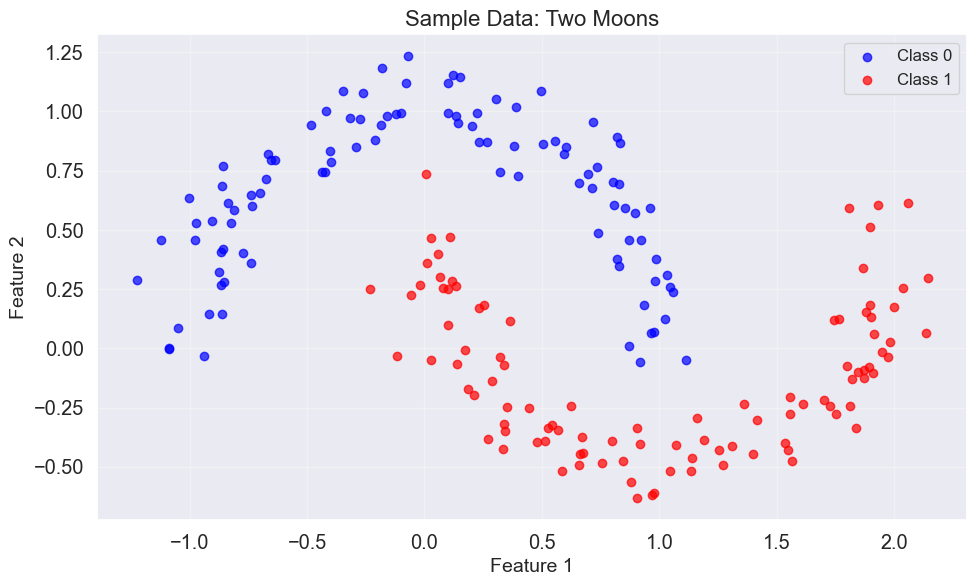

In [22]:
# Generate a simple dataset
def generate_data(n_samples=100, noise=0.1, random_state=42):
    X, y = make_moons(n_samples=n_samples, noise=noise, random_state=random_state)
    return X, y

# Create data
X, y = generate_data(200)

# Plot the data
plt.figure(figsize=(10, 6))
plt.scatter(X[y==0, 0], X[y==0, 1], color='blue', alpha=0.7, label='Class 0')
plt.scatter(X[y==1, 0], X[y==1, 1], color='red', alpha=0.7, label='Class 1')
plt.title('Sample Data: Two Moons', fontsize=16)
plt.xlabel('Feature 1', fontsize=14)
plt.ylabel('Feature 2', fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Epoch 0, Loss: 0.250541
Epoch 1000, Loss: 0.087154
Epoch 2000, Loss: 0.001785
Epoch 3000, Loss: 0.000633
Epoch 4000, Loss: 0.000371


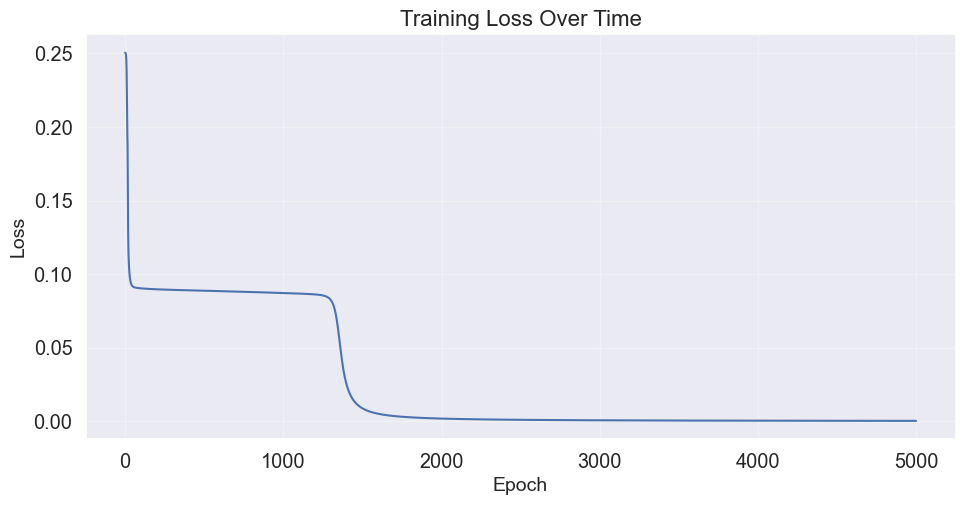

Test Accuracy: 97.50%


In [23]:
# Now let's implement a simple neural network from scratch

class SimpleNeuralNetwork:
    def __init__(self, input_size, hidden_size, output_size):
        # Initialize weights and biases
        self.W1 = np.random.randn(input_size, hidden_size) * 0.1
        self.b1 = np.zeros((1, hidden_size))
        self.W2 = np.random.randn(hidden_size, output_size) * 0.1
        self.b2 = np.zeros((1, output_size))
        
    def sigmoid(self, x):
        return 1 / (1 + np.exp(-np.clip(x, -500, 500)))
    
    def sigmoid_derivative(self, x):
        return x * (1 - x)
    
    def forward(self, X):
        # Forward pass
        self.z1 = np.dot(X, self.W1) + self.b1
        self.a1 = self.sigmoid(self.z1)
        self.z2 = np.dot(self.a1, self.W2) + self.b2
        self.a2 = self.sigmoid(self.z2)
        return self.a2
    
    def backward(self, X, y, output, learning_rate):
        # Backpropagation
        self.output_error = y.reshape(-1, 1) - output
        self.output_delta = self.output_error * self.sigmoid_derivative(output)
        
        self.hidden_error = self.output_delta.dot(self.W2.T)
        self.hidden_delta = self.hidden_error * self.sigmoid_derivative(self.a1)
        
        # Update weights and biases
        self.W2 += self.a1.T.dot(self.output_delta) * learning_rate
        self.b2 += np.sum(self.output_delta, axis=0, keepdims=True) * learning_rate
        self.W1 += X.T.dot(self.hidden_delta) * learning_rate
        self.b1 += np.sum(self.hidden_delta, axis=0, keepdims=True) * learning_rate
    
    def train(self, X, y, epochs, learning_rate):
        losses = []
        for i in range(epochs):
            # Forward pass
            output = self.forward(X)
            
            # Compute loss
            loss = np.mean(np.square(y.reshape(-1, 1) - output))
            losses.append(loss)
            
            # Backward pass
            self.backward(X, y, output, learning_rate)
            
            # Print progress
            if i % 1000 == 0:
                print(f"Epoch {i}, Loss: {loss:.6f}")
        
        return losses
    
    def predict(self, X):
        return (self.forward(X) >= 0.5).astype(int)
    
# Create and train our neural network
nn = SimpleNeuralNetwork(input_size=2, hidden_size=4, output_size=1)
losses = nn.train(X_train, y_train, epochs=5000, learning_rate=0.1)

# Plot the training loss
plt.figure(figsize=(10, 5))
plt.plot(losses)
plt.title('Training Loss Over Time', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.grid(alpha=0.3)
plt.show()

# Evaluate the model
y_pred = nn.predict(X_test).flatten()
accuracy = np.mean(y_pred == y_test)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

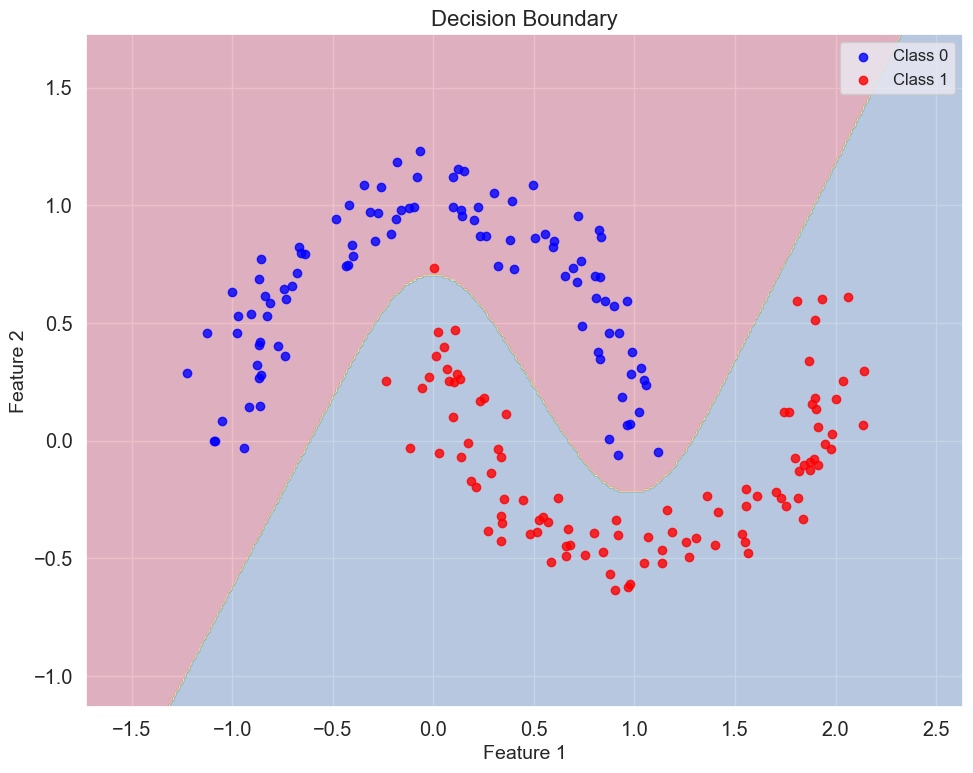

In [24]:
# Let's visualize how our model classifies the data
def plot_decision_boundary(model, X, y):
    # Set min and max values with some padding
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
    
    # Create a meshgrid
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))
    
    # Predict for each point in the meshgrid
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # Plot the decision boundary
    plt.figure(figsize=(10, 8))
    plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.Spectral)
    
    # Plot the data points
    plt.scatter(X[y==0, 0], X[y==0, 1], color='blue', alpha=0.8, label='Class 0')
    plt.scatter(X[y==1, 0], X[y==1, 1], color='red', alpha=0.8, label='Class 1')
    
    plt.title('Decision Boundary', fontsize=16)
    plt.xlabel('Feature 1', fontsize=14)
    plt.ylabel('Feature 2', fontsize=14)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.show()

# Visualize the decision boundary
plot_decision_boundary(nn, X, y)

## 8. Visualizing a Neural Network

Let's create a more detailed visualization of a neural network and how it processes data. We'll see how the data flows through the network layers.

For this visualization, we'll use a simpler dataset that's easier to understand:

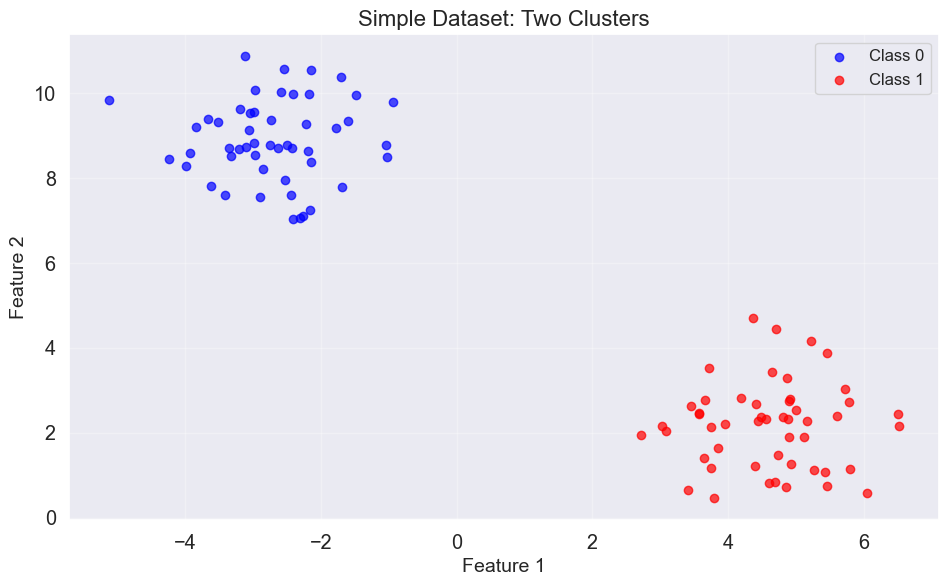

In [26]:
# Create a simple dataset with two clusters
X_simple, y_simple = make_blobs(n_samples=100, centers=2, n_features=2, random_state=42)

# Plot the simple dataset
plt.figure(figsize=(10, 6))
plt.scatter(X_simple[y_simple==0, 0], X_simple[y_simple==0, 1], color='blue', alpha=0.7, label='Class 0')
plt.scatter(X_simple[y_simple==1, 0], X_simple[y_simple==1, 1], color='red', alpha=0.7, label='Class 1')
plt.title('Simple Dataset: Two Clusters', fontsize=16)
plt.xlabel('Feature 1', fontsize=14)
plt.ylabel('Feature 2', fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

# We'll use this data to train a very simple network and visualize its activations
X_train_simple, X_test_simple, y_train_simple, y_test_simple = train_test_split(
    X_simple, y_simple, test_size=0.2, random_state=42
)

# Normalize data for better visualization
X_train_simple = (X_train_simple - X_train_simple.mean(axis=0)) / X_train_simple.std(axis=0)
X_test_simple = (X_test_simple - X_test_simple.mean(axis=0)) / X_test_simple.std(axis=0)

/var/folders/dq/mt9lqsxx40jg5xzzmmx47fzr0000gn/T/ipykernel_62617/4239376682.py:161: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/dq/mt9lqsxx40jg5xzzmmx47fzr0000gn/T/ipykernel_62617/4239376682.py:161: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.
  plt.tight_layout()
/Users/hananzaichyk/Documents/sentra/repositories/ml-entry-workshop/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/hananzaichyk/Documents/sentra/repositories/ml-entry-workshop/.venv/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8322 (\N{SUBSCRIPT TWO}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


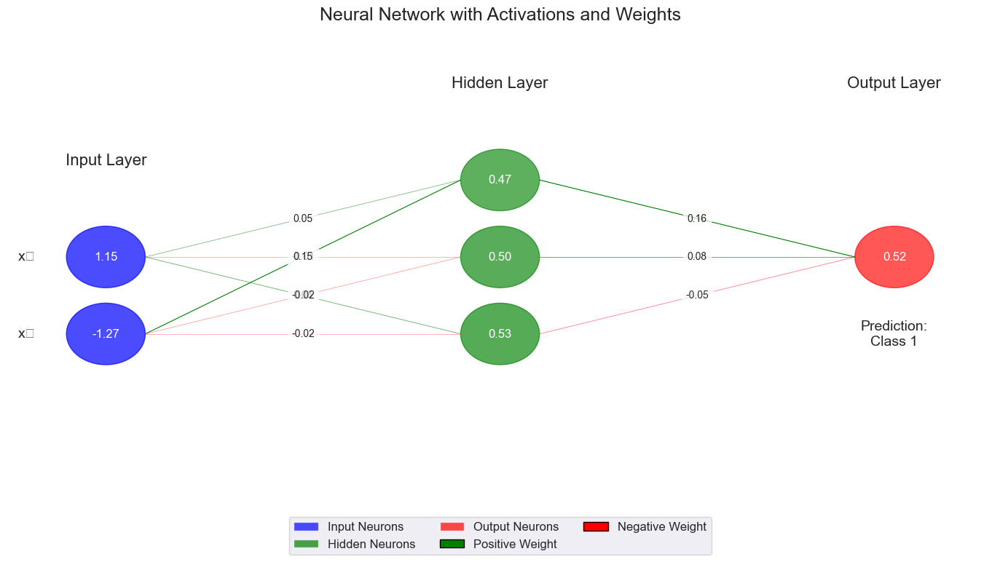

IndexError: index 0 is out of bounds for axis 0 with size 0

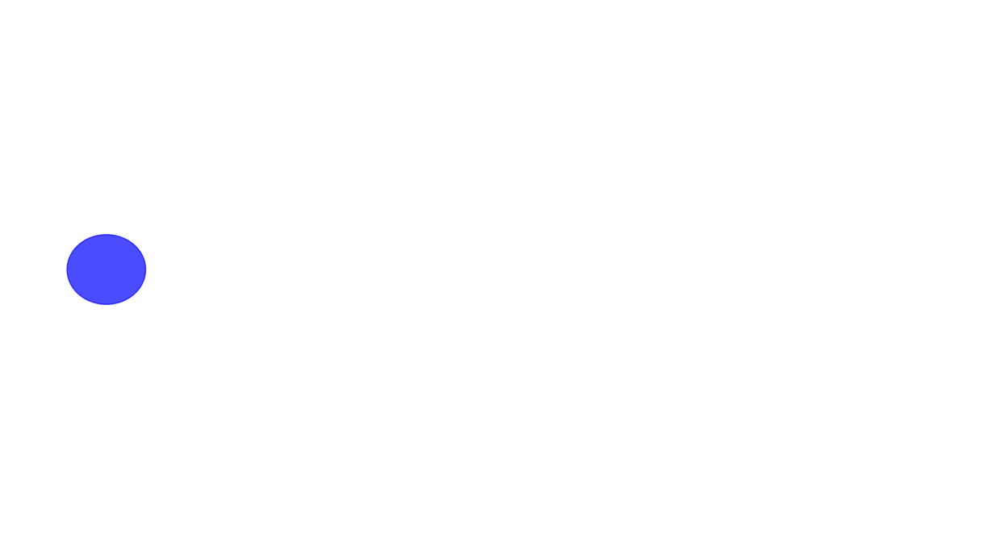

In [27]:
# Create a simple neural network with visualization capabilities
class VisualNN:
    def __init__(self, input_size, hidden_size, output_size):
        # Initialize weights with fixed random values for consistent visualization
        np.random.seed(42)
        self.W1 = np.random.randn(input_size, hidden_size) * 0.1
        self.b1 = np.zeros((1, hidden_size))
        self.W2 = np.random.randn(hidden_size, output_size) * 0.1
        self.b2 = np.zeros((1, output_size))
        
    def sigmoid(self, x):
        return 1 / (1 + np.exp(-np.clip(x, -500, 500)))
    
    def forward(self, X):
        # Store all intermediate values for visualization
        self.X = X
        self.z1 = np.dot(X, self.W1) + self.b1
        self.a1 = self.sigmoid(self.z1)
        self.z2 = np.dot(self.a1, self.W2) + self.b2
        self.a2 = self.sigmoid(self.z2)
        return self.a2
    
    def predict(self, X):
        return (self.forward(X) >= 0.5).astype(int)
    
    def visualize_network(self, sample_idx=0):
        """Visualize the network with activations for a specific sample"""
        # Ensure we have run forward pass
        if not hasattr(self, 'X'):
            raise ValueError("Run forward pass first")
            
        # Get a single sample
        x = self.X[sample_idx:sample_idx+1]
        
        # Run forward pass for this sample if not already done
        self.forward(x)
        
        # Create the plot
        fig, ax = plt.subplots(figsize=(14, 8))
        ax.set_xlim(0, 10)
        ax.set_ylim(0, 6)
        ax.axis('off')
        
        # Layer positions
        input_x, hidden_x, output_x = 1.0, 5.0, 9.0
        
        # Place neurons
        input_neurons = []
        for i in range(2):  # 2 input features
            y_pos = 3 - i
            # Create neuron with activation value from input
            circle = plt.Circle((input_x, y_pos), 0.4, fill=True, 
                                color='blue', alpha=0.7)
            ax.add_patch(circle)
            # Display the value
            ax.text(input_x, y_pos, f'{x[0, i]:.2f}', ha='center', va='center', 
                    color='white', fontsize=12)
            input_neurons.append((input_x, y_pos))
        
        # Add input labels
        ax.text(input_x, 4.2, 'Input Layer', ha='center', fontsize=16)
        ax.text(input_x - 0.8, 3, 'x₁', ha='center', va='center', fontsize=14)
        ax.text(input_x - 0.8, 2, 'x₂', ha='center', va='center', fontsize=14)
        
        # Hidden layer neurons
        hidden_neurons = []
        for i in range(3):  # 3 hidden neurons
            y_pos = 4 - i
            # Map activation to color intensity
            activation = self.a1[0, i]
            # Create neuron with activation-based color
            circle = plt.Circle((hidden_x, y_pos), 0.4, fill=True, 
                                color='green', alpha=0.4 + 0.5 * activation)
            ax.add_patch(circle)
            # Display the activation value
            ax.text(hidden_x, y_pos, f'{activation:.2f}', ha='center', va='center', 
                    color='white', fontsize=12)
            hidden_neurons.append((hidden_x, y_pos))
        
        # Add hidden layer label
        ax.text(hidden_x, 5.2, 'Hidden Layer', ha='center', fontsize=16)
        
        # Output layer neurons
        output_neurons = []
        for i in range(1):  # 1 output neuron
            y_pos = 3
            # Get the prediction
            prediction = self.a2[0, i]
            # Create neuron with activation-based color
            circle = plt.Circle((output_x, y_pos), 0.4, fill=True, 
                                color='red', alpha=0.4 + 0.5 * prediction)
            ax.add_patch(circle)
            # Display the prediction
            ax.text(output_x, y_pos, f'{prediction:.2f}', ha='center', va='center', 
                    color='white', fontsize=12)
            output_neurons.append((output_x, y_pos))
            
            # Add class prediction
            predicted_class = "Class 1" if prediction >= 0.5 else "Class 0"
            ax.text(output_x, y_pos - 1, f'Prediction:\n{predicted_class}', 
                    ha='center', va='center', fontsize=14)
        
        # Add output layer label
        ax.text(output_x, 5.2, 'Output Layer', ha='center', fontsize=16)
        
        # Connect input to hidden layer with weighted connections
        for i, i_pos in enumerate(input_neurons):
            for j, h_pos in enumerate(hidden_neurons):
                # Get the weight for this connection
                weight = self.W1[i, j]
                # Set line width based on weight magnitude
                lw = 0.5 + 2 * abs(weight)
                # Set color based on weight sign
                color = 'red' if weight < 0 else 'green'
                # Set alpha based on weight magnitude
                alpha = 0.3 + 0.7 * abs(weight) / max(0.1, abs(self.W1).max())
                # Draw the connection
                ax.plot([i_pos[0] + 0.4, h_pos[0] - 0.4], [i_pos[1], h_pos[1]], 
                        '-', color=color, linewidth=lw, alpha=alpha)
                # Add weight label
                mid_x = (i_pos[0] + h_pos[0]) / 2
                mid_y = (i_pos[1] + h_pos[1]) / 2
                ax.text(mid_x, mid_y, f'{weight:.2f}', ha='center', va='center', 
                        fontsize=10, bbox=dict(facecolor='white', alpha=0.7))
        
        # Connect hidden to output layer
        for i, h_pos in enumerate(hidden_neurons):
            for j, o_pos in enumerate(output_neurons):
                # Get the weight for this connection
                weight = self.W2[i, j]
                # Set line width based on weight magnitude
                lw = 0.5 + 2 * abs(weight)
                # Set color based on weight sign
                color = 'red' if weight < 0 else 'green'
                # Set alpha based on weight magnitude
                alpha = 0.3 + 0.7 * abs(weight) / max(0.1, abs(self.W2).max())
                # Draw the connection
                ax.plot([h_pos[0] + 0.4, o_pos[0] - 0.4], [h_pos[1], o_pos[1]], 
                        '-', color=color, linewidth=lw, alpha=alpha)
                # Add weight label
                mid_x = (h_pos[0] + o_pos[0]) / 2
                mid_y = (h_pos[1] + o_pos[1]) / 2
                ax.text(mid_x, mid_y, f'{weight:.2f}', ha='center', va='center', 
                        fontsize=10, bbox=dict(facecolor='white', alpha=0.7))
        
        # Add title
        ax.set_title('Neural Network with Activations and Weights', fontsize=18)
        
        # Add legend
        from matplotlib.patches import Patch
        legend_elements = [
            Patch(facecolor='blue', alpha=0.7, label='Input Neurons'),
            Patch(facecolor='green', alpha=0.7, label='Hidden Neurons'),
            Patch(facecolor='red', alpha=0.7, label='Output Neurons'),
            Patch(facecolor='green', edgecolor='black', label='Positive Weight'),
            Patch(facecolor='red', edgecolor='black', label='Negative Weight')
        ]
        ax.legend(handles=legend_elements, loc='upper center', 
                  bbox_to_anchor=(0.5, -0.05), ncol=3, fontsize=12)
        
        plt.tight_layout()
        plt.show()

# Create and test our visual neural network
visual_nn = VisualNN(input_size=2, hidden_size=3, output_size=1)

# Forward pass on the whole dataset
predictions = visual_nn.forward(X_train_simple)

# Visualize the network for the first sample
visual_nn.visualize_network(sample_idx=0)

# Let's also see the network for a sample from the other class
other_class_idx = np.where(y_train_simple != y_train_simple[0])[0][0]
visual_nn.visualize_network(sample_idx=other_class_idx)

## 9. Applications and Use Cases

Neural networks are versatile tools that can be applied to a wide range of problems:

### Image Classification
- Identifying objects in images
- Medical image analysis
- Facial recognition
- Self-driving cars vision

### Natural Language Processing
- Machine translation
- Sentiment analysis
- Text generation
- Chatbots and virtual assistants

### Speech Recognition
- Voice assistants
- Call center automation
- Transcription services
- Language identification

### Time Series Analysis
- Stock price prediction
- Weather forecasting
- Energy demand prediction
- Anomaly detection

### Recommender Systems
- Product recommendations
- Content suggestions
- Personalized marketing
- Movie and music recommendations

### Game Playing
- Chess and Go champions
- Video game AI
- Strategy optimization
- Reinforcement learning agents

Let's visualize some of these applications:

In [ ]:
# Visualize various neural network applications
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

# 1. Image Classification
axes[0].set_title('Image Classification', fontsize=14)
axes[0].text(0.5, 0.5, 'Image → CNN → [Dog, Cat, Bird, ...]', 
             ha='center', va='center', fontsize=12)
axes[0].axis('off')

# 2. Natural Language Processing
axes[1].set_title('Natural Language Processing', fontsize=14)
axes[1].text(0.5, 0.5, 'Text → RNN/Transformer → Intent/Meaning', 
             ha='center', va='center', fontsize=12)
axes[1].axis('off')

# 3. Time Series Analysis
axes[2].set_title('Time Series Analysis', fontsize=14)
# Create a simple time series
x = np.linspace(0, 10, 100)
y = np.sin(x) + np.random.normal(0, 0.1, size=100)
axes[2].plot(x, y, 'b-')
axes[2].plot(x, np.sin(x), 'r--')
axes[2].set_xticks([])
axes[2].set_yticks([])
axes[2].set_xlabel('Time')
axes[2].set_ylabel('Value')

# 4. Recommender Systems
axes[3].set_title('Recommender Systems', fontsize=14)
# Create a user-item matrix visualization
user_item = np.random.randint(0, 5, size=(10, 15))
user_item[user_item == 0] = np.nan
im = axes[3].imshow(user_item, cmap='YlGnBu')
axes[3].set_xticks([])
axes[3].set_yticks([])
axes[3].set_xlabel('Items')
axes[3].set_ylabel('Users')

# 5. Reinforcement Learning
axes[4].set_title('Reinforcement Learning', fontsize=14)
# Create a simple maze-like environment
grid = np.ones((10, 10))
grid[2:8, 2] = 0
grid[2, 2:8] = 0
grid[2:8, 7] = 0
grid[7, 2:8] = 0
grid[4, 4:7] = 0
grid[5, 4] = 0
grid[2, 2] = 2  # Start
grid[7, 7] = 3  # Goal
cmap = plt.cm.colors.ListedColormap(['white', 'black', 'green', 'red'])
axes[4].imshow(grid, cmap=cmap)
axes[4].set_xticks([])
axes[4].set_yticks([])

# 6. Speech Recognition
axes[5].set_title('Speech Recognition', fontsize=14)
# Create a simple waveform and spectrogram
t = np.linspace(0, 10, 1000)
audio = np.sin(2 * np.pi * 1 * t) + 0.5 * np.sin(2 * np.pi * 2 * t) + 0.2 * np.sin(2 * np.pi * 4 * t)
audio += np.random.normal(0, 0.1, size=1000)
axes[5].plot(t, audio, 'k-', linewidth=0.5)
axes[5].set_xticks([])
axes[5].set_yticks([])
axes[5].set_xlabel('Time')
axes[5].text(5, 0, 'Audio → NN → Text', ha='center', va='center')

plt.tight_layout()
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

## 10. Hands-on Exercise

Now that you understand the basics of neural networks, let's try a hands-on exercise. 

In this exercise, you'll create a simple neural network to classify two types of data points.

### Task:
1. Create a dataset with two classes
2. Build a simple neural network with one hidden layer
3. Train the network
4. Visualize the decision boundary
5. Try changing the network architecture and see how it affects the results

Here's some starter code to help you get going:

In [ ]:
# Exercise: Build your own neural network

# Step 1: Create a dataset
def create_dataset(n_samples=300, noise=0.2, random_state=None):
    """Create a dataset with two interleaving half circles"""
    from sklearn.datasets import make_moons
    X, y = make_moons(n_samples=n_samples, noise=noise, random_state=random_state)
    return X, y

# Step 2: Define a class for our neural network
class MyNeuralNetwork:
    def __init__(self, input_size, hidden_size, output_size):
        # Initialize random weights and biases
        np.random.seed(42)
        self.W1 = np.random.randn(input_size, hidden_size) * 0.1
        self.b1 = np.zeros((1, hidden_size))
        self.W2 = np.random.randn(hidden_size, output_size) * 0.1
        self.b2 = np.zeros((1, output_size))
        
    def sigmoid(self, x):
        return 1 / (1 + np.exp(-np.clip(x, -500, 500)))
    
    def sigmoid_derivative(self, x):
        return x * (1 - x)
    
    def forward(self, X):
        # Forward pass
        self.z1 = np.dot(X, self.W1) + self.b1
        self.a1 = self.sigmoid(self.z1)
        self.z2 = np.dot(self.a1, self.W2) + self.b2
        self.a2 = self.sigmoid(self.z2)
        return self.a2
    
    def backward(self, X, y, output, learning_rate):
        # Backpropagation
        self.output_error = y.reshape(-1, 1) - output
        self.output_delta = self.output_error * self.sigmoid_derivative(output)
        
        self.hidden_error = self.output_delta.dot(self.W2.T)
        self.hidden_delta = self.hidden_error * self.sigmoid_derivative(self.a1)
        
        # Update weights and biases
        self.W2 += self.a1.T.dot(self.output_delta) * learning_rate
        self.b2 += np.sum(self.output_delta, axis=0, keepdims=True) * learning_rate
        self.W1 += X.T.dot(self.hidden_delta) * learning_rate
        self.b1 += np.sum(self.hidden_delta, axis=0, keepdims=True) * learning_rate
    
    def train(self, X, y, epochs, learning_rate):
        losses = []
        for i in range(epochs):
            # Forward pass
            output = self.forward(X)
            
            # Compute loss
            loss = np.mean(np.square(y.reshape(-1, 1) - output))
            losses.append(loss)
            
            # Backward pass
            self.backward(X, y, output, learning_rate)
            
            # Print progress
            if i % 1000 == 0:
                print(f"Epoch {i}, Loss: {loss:.6f}")
        
        return losses
    
    def predict(self, X):
        return (self.forward(X) >= 0.5).astype(int)

# Step 3: Visualize decision boundaries
def plot_decision_boundary(model, X, y):
    # Set min and max values with some padding
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
    
    # Create a meshgrid
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                         np.arange(y_min, y_max, 0.01))
    
    # Predict for each point in the meshgrid
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # Plot the decision boundary
    plt.figure(figsize=(10, 8))
    plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.Spectral)
    
    # Plot the data points
    plt.scatter(X[y==0, 0], X[y==0, 1], color='blue', alpha=0.8, label='Class 0')
    plt.scatter(X[y==1, 0], X[y==1, 1], color='red', alpha=0.8, label='Class 1')
    
    plt.title('Decision Boundary', fontsize=16)
    plt.xlabel('Feature 1', fontsize=14)
    plt.ylabel('Feature 2', fontsize=14)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.show()

# Step 4: Run the experiment
# Create a dataset
X, y = create_dataset(random_state=42)

# Plot the dataset
plt.figure(figsize=(10, 6))
plt.scatter(X[y==0, 0], X[y==0, 1], color='blue', alpha=0.7, label='Class 0')
plt.scatter(X[y==1, 0], X[y==1, 1], color='red', alpha=0.7, label='Class 1')
plt.title('Training Data: Two Moons', fontsize=16)
plt.xlabel('Feature 1', fontsize=14)
plt.ylabel('Feature 2', fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

# Create the neural network
# Try different hidden layer sizes! (e.g., 3, 5, 10, 20)
nn = MyNeuralNetwork(input_size=2, hidden_size=5, output_size=1)

# Train the network
# Try different learning rates and epochs!
losses = nn.train(X, y, epochs=5000, learning_rate=0.1)

# Plot the training loss
plt.figure(figsize=(10, 5))
plt.plot(losses)
plt.title('Training Loss Over Time', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.grid(alpha=0.3)
plt.show()

# Visualize the decision boundary
plot_decision_boundary(nn, X, y)

# Step 5: Experiment!
# TODO: Try modifying the neural network architecture or hyperparameters
# Here are some ideas:
# - Change the number of hidden layers and neurons
# - Try different activation functions (ReLU, tanh)
# - Adjust the learning rate
# - Use different datasets
# - Add more features to the input data

# EXERCISE: Try with different hidden layer sizes
print("Experiment with hidden layer size = 3:")
nn_small = MyNeuralNetwork(input_size=2, hidden_size=3, output_size=1)
nn_small.train(X, y, epochs=5000, learning_rate=0.1)
plot_decision_boundary(nn_small, X, y)

print("Experiment with hidden layer size = 10:")
nn_large = MyNeuralNetwork(input_size=2, hidden_size=10, output_size=1)
nn_large.train(X, y, epochs=5000, learning_rate=0.1)
plot_decision_boundary(nn_large, X, y)

## Summary

In this notebook, we've explored the fascinating world of neural networks from the ground up:

1. **Introduction to Neural Networks**: We learned that neural networks are computational models inspired by the human brain, designed to recognize patterns in data.

2. **Biological Inspiration**: We saw how artificial neurons mimic biological neurons, with inputs, weights, and activation functions.

3. **Basic Components**: We explored the architecture of neural networks, including input layers, hidden layers, output layers, weights, and biases.

4. **Activation Functions**: We examined various activation functions like sigmoid, tanh, and ReLU that introduce non-linearity into networks.

5. **Forward Propagation**: We visualized how data flows through a neural network from input to output.

6. **Simple Neural Network Example**: We built a neural network from scratch and trained it on a classification task.

7. **Training**: We explored how neural networks learn through backpropagation and gradient descent.

8. **Visualizing Neural Networks**: We created detailed visualizations of neural networks in action.

9. **Applications**: We surveyed the diverse applications of neural networks in image recognition, NLP, time series analysis, and more.

10. **Hands-on Exercise**: We put our knowledge into practice by building and experimenting with neural networks.

Neural networks have revolutionized artificial intelligence and continue to drive innovations across virtually every industry. The concepts covered in this notebook provide a foundation for understanding more complex architectures like convolutional neural networks (CNNs), recurrent neural networks (RNNs), and transformers.

As you continue your journey in machine learning, remember that neural networks are powerful tools, but they're just one part of the machine learning ecosystem. Understanding when and how to apply them effectively is just as important as knowing how they work.